cpu


Epoch Loss:2370.721: 100%|██████████| 800/800 [20:48<00:00,  1.56s/it]  


TypeError: stat: path should be string, bytes, os.PathLike or integer, not NoneType

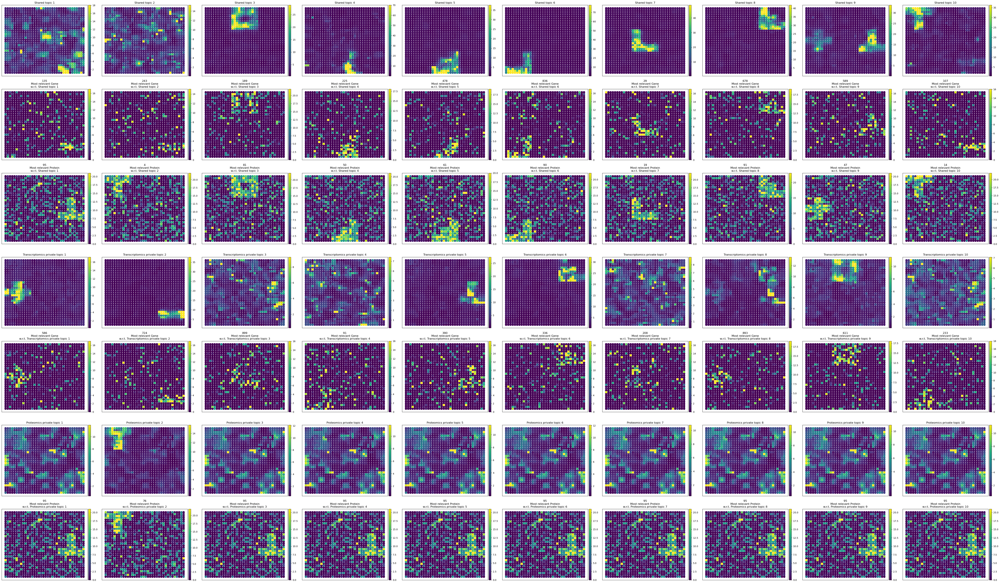

In [5]:
import os
import anndata
import torch
from sklearn.metrics import adjusted_rand_score
import torch.nn.functional as F
from Methods.SpaMV.spamv import SpaMV
from Methods.SpaMV.utils import pca, clr_normalize_each_cell, clustering, plot_embedding_results
import scanpy as sc
import matplotlib.pyplot as plt
import wandb

os.environ["WANDB_SILENT"] = "true"
import logging

loggers = [logging.getLogger(name) for name in logging.root.manager.loggerDict]
for logger in loggers:
    logger.setLevel(logging.WARN)
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
for dataset in ['1_Simulation', '2_Simulation', '3_Simulation']:
    adata_rna = sc.read_h5ad('../Dataset/' + dataset + '/adata_RNA.h5ad')
    adata_pro = sc.read_h5ad('../Dataset/' + dataset + '/adata_ADT.h5ad')

    wandb.init()
    wandb.login()
    model = SpaMV([adata_rna, adata_pro], zs_dim=10, zp_dims=[10, 10], interpretable=True, neighborhood_embedding=0,
                  beta=[1, 1], max_epochs=800, recon_types=['nb', 'nb'], learning_rate=1e-2,
                  omics_names=['Transcriptomics', 'Proteomics'])
    model.train()
    wandb.finish()

    z, w = model.get_embedding_and_feature_by_topic()
    plot_embedding_results([adata_rna, adata_pro], ['Transcriptomics', 'Proteomics'], z, w, show=True)
    a = 1
